# Bird Sounds Exploration
### Libraries and Files

In [1]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn           as sns
import pandas            as pd
import numpy             as np
import librosa
import IPython.display

matplotlib.rcParams['savefig.dpi'] = 144
%matplotlib inline

In [5]:
sr  = 44100

b1,_  = librosa.load('audio/bird_1.wav',sr=sr,mono=True)
b2,_  = librosa.load('audio/bird_2.wav',sr=sr,mono=True)
b3,_  = librosa.load('audio/bird_3.wav',sr=sr,mono=True)
nb1,_ = librosa.load('audio/no_bird_1.wav',sr=sr,mono=True)
nb2,_ = librosa.load('audio/no_bird_2.wav',sr=sr,mono=True)
nb3,_ = librosa.load('audio/no_bird_3.wav',sr=sr,mono=True)

## Sounds and Plots

In [7]:
IPython.display.Audio(data=b1,rate=sr)

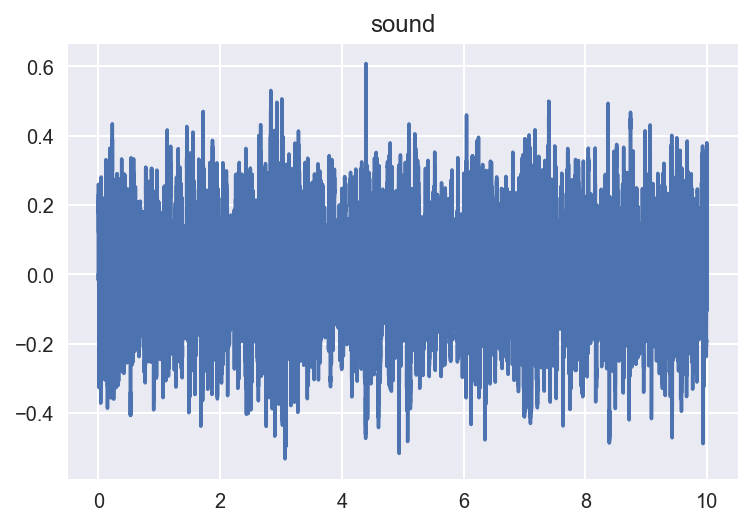

In [8]:
T = len(b1)/sr
t = np.linspace(0,T,len(b1)) # reconstructed timestamps

plt.plot(t,b1)
plt.title("sound")
plt.show()

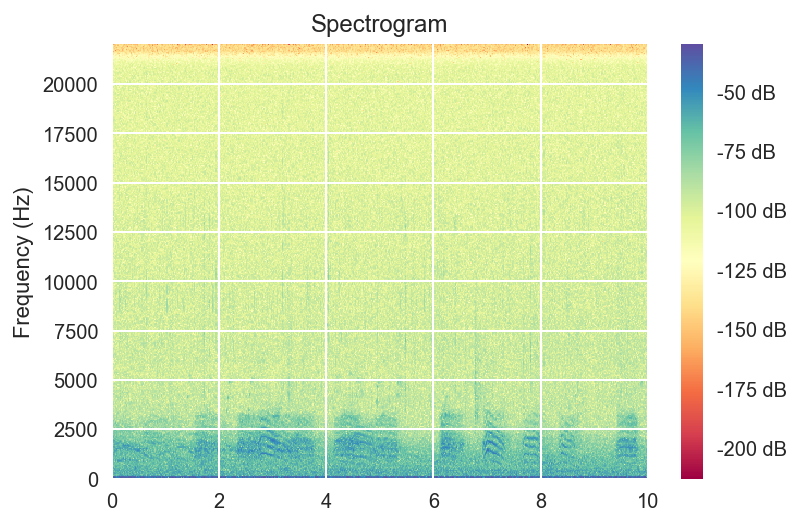

In [11]:
_ = plt.specgram(b1,Fs=sr,NFFT=1024,cmap=plt.get_cmap('Spectral'))
plt.colorbar(format='%+2.0f dB')
plt.ylim(0,sr/2)
plt.title("Spectrogram")
plt.ylabel("Frequency (Hz)")
plt.show()

In [12]:
IPython.display.Audio(data=b2,rate=sr)

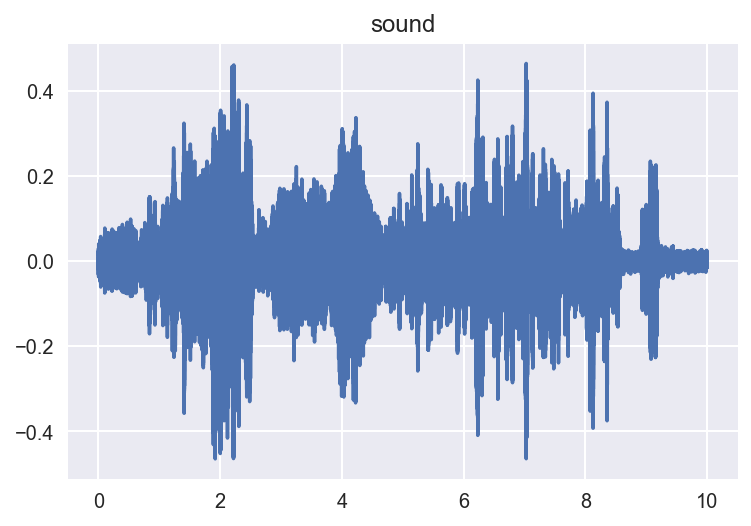

In [13]:
T = len(b2)/sr
t = np.linspace(0,T,len(b2)) # reconstructed timestamps

plt.plot(t,b2)
plt.title("sound")
plt.show()

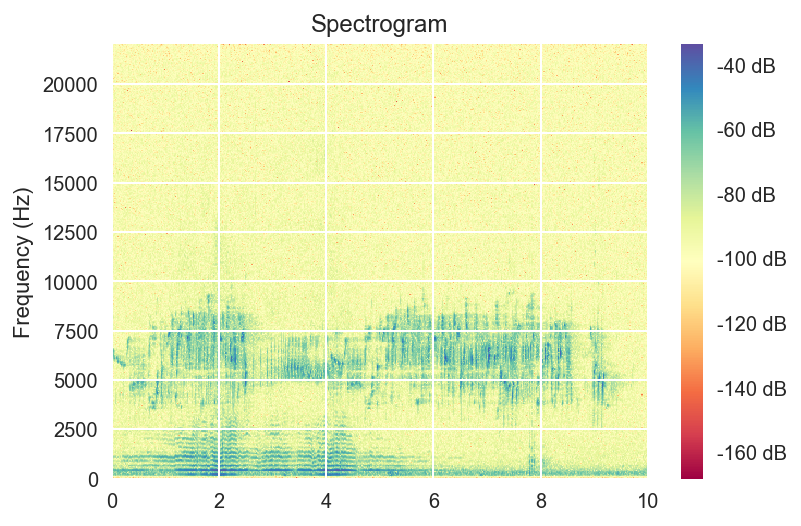

In [14]:
_ = plt.specgram(b2,Fs=sr,NFFT=1024,cmap=plt.get_cmap('Spectral'),)
plt.colorbar(format='%+2.0f dB')
plt.ylim(0,sr/2)
plt.title("Spectrogram")
plt.ylabel("Frequency (Hz)")
plt.show()

In [15]:
IPython.display.Audio(data=b3,rate=sr)

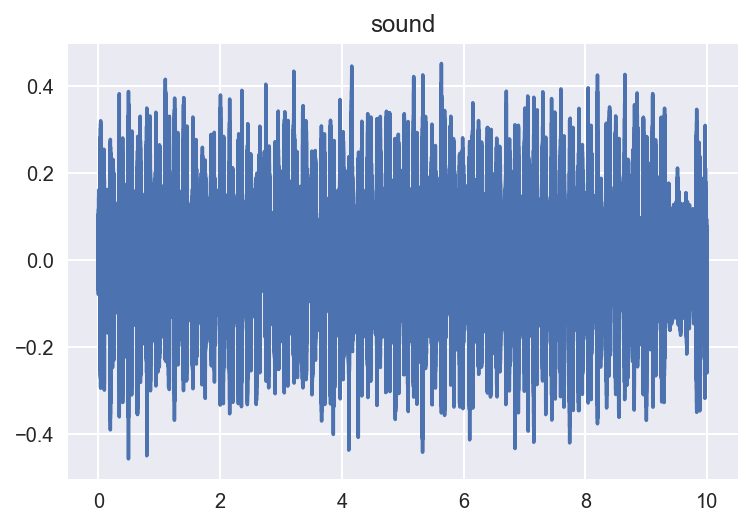

In [16]:
T = len(b3)/sr
t = np.linspace(0,T,len(b3)) # reconstructed timestamps

plt.plot(t,b3)
plt.title("sound")
plt.show()

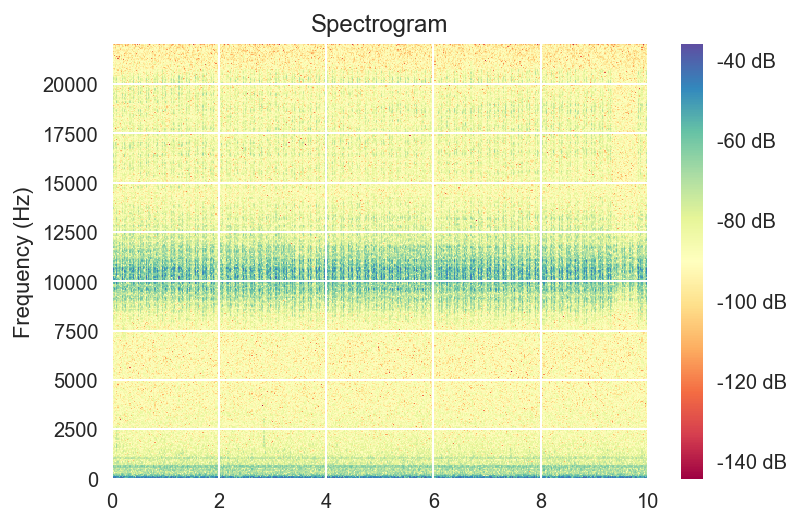

In [17]:
_ = plt.specgram(b3,Fs=sr,NFFT=1024,cmap=plt.get_cmap('Spectral'),)
plt.colorbar(format='%+2.0f dB')
plt.ylim(0,sr/2)
plt.title("Spectrogram")
plt.ylabel("Frequency (Hz)")
plt.show()

In [18]:
IPython.display.Audio(data=nb1,rate=sr)

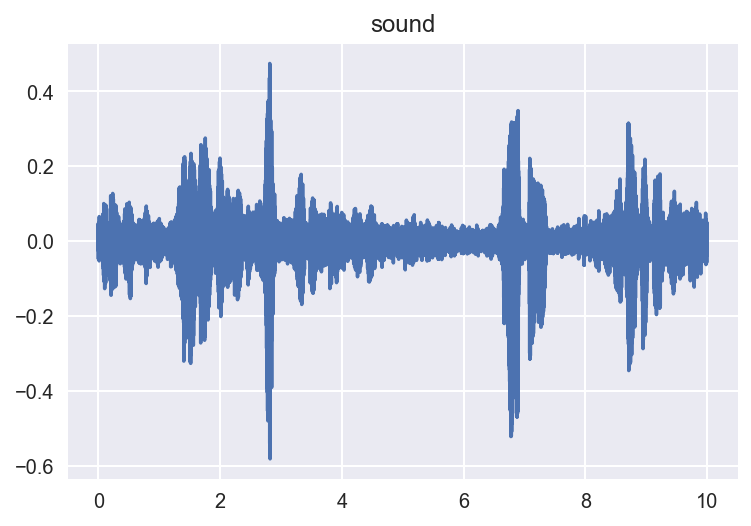

In [19]:
T = len(nb1)/sr
t = np.linspace(0,T,len(nb1)) # reconstructed timestamps

plt.plot(t,nb1)
plt.title("sound")
plt.show()

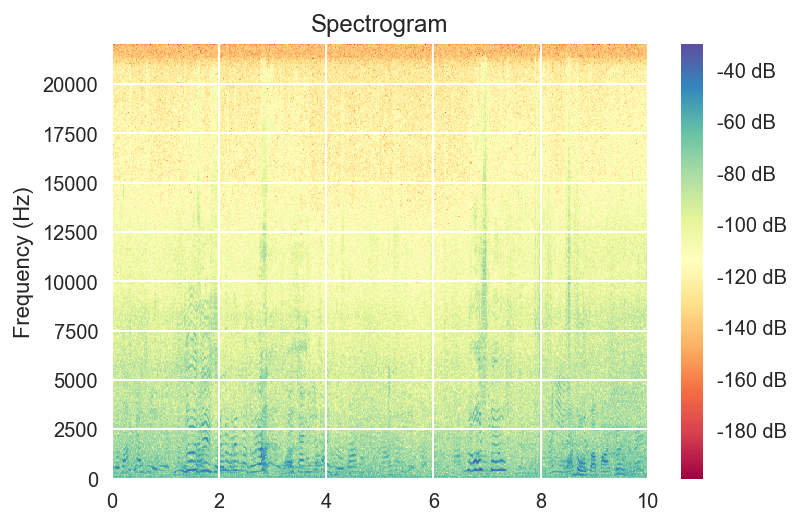

In [20]:
_ = plt.specgram(nb1,Fs=sr,NFFT=1024,cmap=plt.get_cmap('Spectral'),)
plt.colorbar(format='%+2.0f dB')
plt.ylim(0,sr/2)
plt.title("Spectrogram")
plt.ylabel("Frequency (Hz)")
plt.show()

In [21]:
IPython.display.Audio(data=nb2,rate=sr)

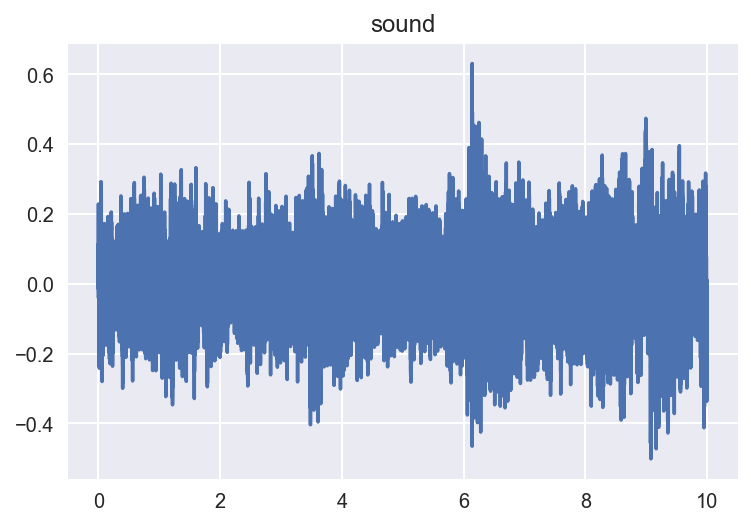

In [22]:
T = len(nb2)/sr
t = np.linspace(0,T, len(nb2)) # reconstructed timestamps

plt.plot(t,nb2)
plt.title("sound")
plt.show()

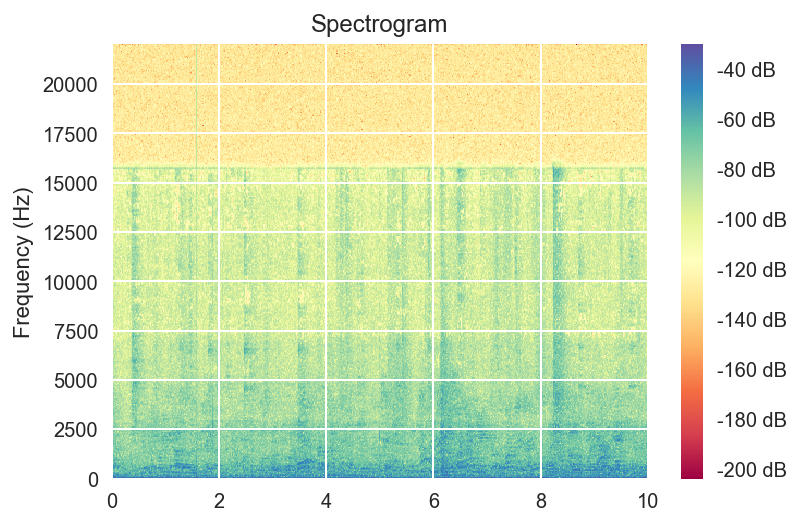

In [23]:
_ = plt.specgram(nb2,Fs=sr,NFFT=1024,cmap=plt.get_cmap('Spectral'),)
plt.colorbar(format='%+2.0f dB')
plt.ylim(0,sr/2)
plt.title("Spectrogram")
plt.ylabel("Frequency (Hz)")
plt.show()

In [24]:
IPython.display.Audio(data=nb3,rate=sr)

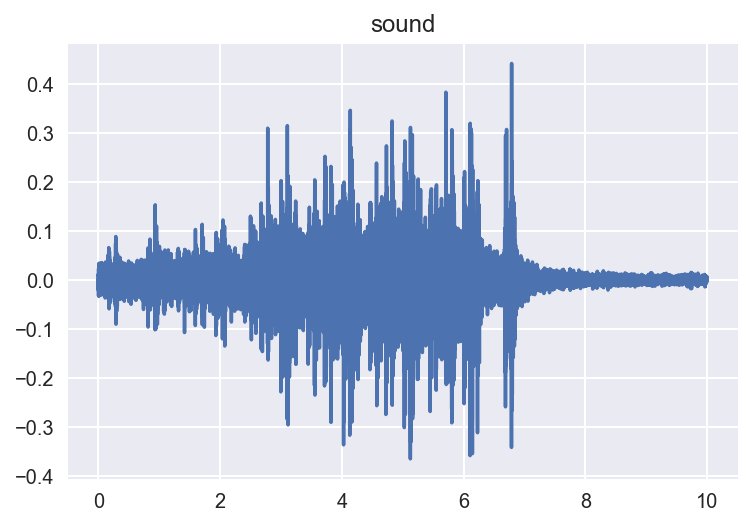

In [25]:
T = len(nb3)/sr
t = np.linspace(0,T,len(nb3)) # reconstructed timestamps

plt.plot(t,nb3)
plt.title("sound")
plt.show()

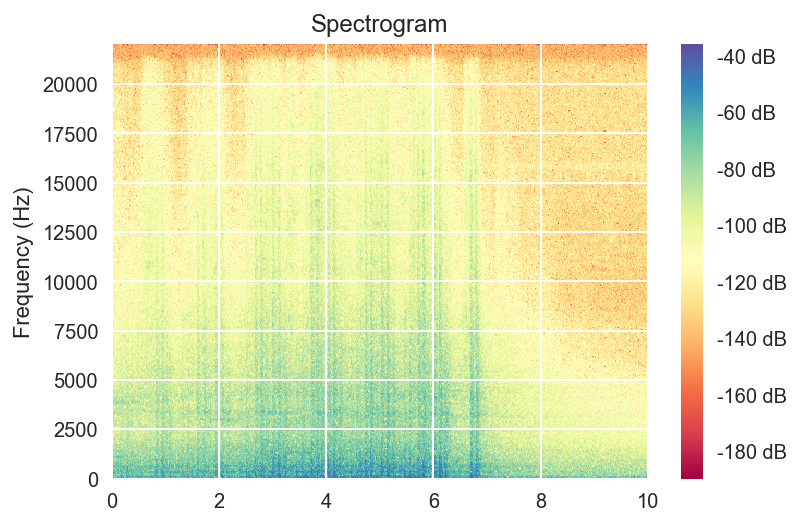

In [26]:
_ = plt.specgram(nb3,Fs=sr,NFFT=1024,cmap=plt.get_cmap('Spectral'),)
plt.colorbar(format='%+2.0f dB')
plt.ylim(0,sr/2)
plt.title("Spectrogram")
plt.ylabel("Frequency (Hz)")
plt.show()

## Uses of spectrogram

**How the spectrogram can be used to detect birds?** Feel free to write pseudo-code if needed.

Spectrograms give us a 2D image of the a sound sample.
- The X axis is the time, time is further divided in samples (depending on the sampling rate, in this case 44100 Hz) which is how many times per second the the sound sampled and a quantitized value asigned.
- The Y value shows the presence of a certain frecuecies at that instant of time, the previous spectrograms are colorcoded, red for the lowest prevalecence of the frecuency and blue for the highest.
- By the Nyquist rate we realize the highest frequency that can be recovered from the sampled (digital) file is 1/2 the sampling frequency (44100 - 22050, 22050 - 11025)

How to used them?

We aim to classify if there is a bird chirp in the sound files provided, bird chirps have certain characteristic frequencies associated that appear in the spectrograms as well as patterns (changing of tones and intensity of the chirps) that can be appreciated visually and by the classfiers numerically.

It is important to take into account the codification of the audio, as well as the tools used for recording them, for example if I consistently record the bird chirps with a microphone that adds a 60 Hz frecuency to the recording, and the rest of the sounds with another that doesn't, my spectrogram and classification algorithms would be looking for that 60Hz signal, no the bird chirp. If the codecs are different or add distinctive artifacts to the audio, then the same thing can happen. The conditions can have an influence too (like birds are usually outside and windy conditions can add noise to the recording, whereas indoors conditions do not have that).

From what I see in the spectrograms, bird spectrograms seem to have "bands" of more energetic frequencies (bottom, center, top-bottom) respectively whereas not bird recordings have the frequency energies more spread out on the spectrum. I think this could have more to do with the recording overall that with bird chirp itself.

If we are aiming for more specific data, we can remove common (known) sources of noice with a filter or just pass a particular range of frequencies (if we know what we are looking for).

### Classification

In [27]:
df     = pd.read_csv('features.csv')
target = df['class']
target = target.apply(lambda x: 1 if x == 'BIRD' else 0 )
df.drop(['class','file_id'],axis=1,inplace=True)

In [28]:
df.shape

(12667, 256)

In [29]:
from bokeh.io       import push_notebook, show, output_notebook
from bokeh.layouts  import gridplot, row
from bokeh.palettes import Viridis3, Category10
from bokeh.plotting import figure
from bokeh.models   import HoverTool, BoxSelectTool
from bokeh.charts   import Bar
output_notebook()

Loading BokehJS ...

In [30]:
from   sklearn.decomposition import PCA
pca    = PCA(n_components=4,whiten=True)
pca.fit(df)

domPCA = pd.DataFrame(pca.fit_transform(df),index=df.index,columns=['x','y','z','w'])

*The goal of whitening is to make the input less redundant; more formally, our desiderata are that our learning algorithms sees a training input where (i) the features are less correlated with each other, and (ii) the features all have the same variance.*

In [31]:
pca.explained_variance_ratio_

array([ 0.90680018,  0.04175101,  0.00964384,  0.00769357])

## PCA 2D Plots

In [32]:
p30                  = figure(title = "PCA 1st vs 2nd Dimensions",width=480,height=480)
p30.circle(domPCA['x'].ix[target==0],domPCA['y'].ix[target==0],color=Viridis3[0],fill_alpha=0.2,size=1,legend='No Bird')
p30.circle(domPCA['x'].ix[target==1],domPCA['y'].ix[target==1],color=Viridis3[1],fill_alpha=0.2,size=1,legend='Bird')
p30.xaxis.axis_label = 'Dimension 1'
p30.yaxis.axis_label = 'Dimension 2'
p30.legend.location  = "top_left"

p31                  = figure(title = "PCA 3rd vs 4th Dimensions",width=480,height=480)
p31.circle(domPCA['z'].ix[target==0],domPCA['w'].ix[target==0],color=Viridis3[0],fill_alpha=0.2,size=1,legend='No Bird')
p31.circle(domPCA['z'].ix[target==1],domPCA['w'].ix[target==1],color=Viridis3[1],fill_alpha=0.2,size=1,legend='Bird')
p31.xaxis.axis_label = 'Dimension 3'
p31.yaxis.axis_label = 'Dimension 4'
p31.legend.location  = "top_left"

grid = gridplot([[p30,p31]])
show(grid)

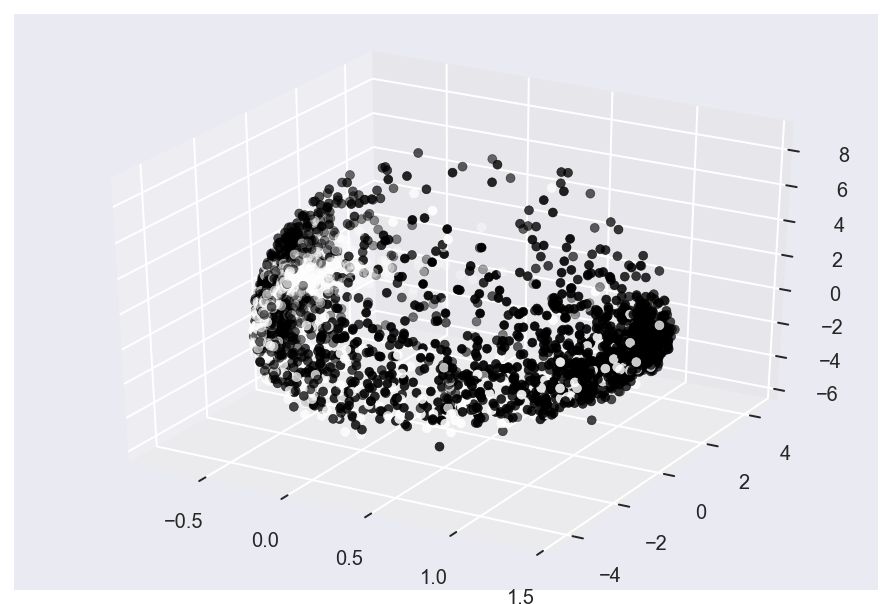

In [33]:
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from mpl_toolkits.mplot3d import Axes3D

fig  = plt.figure()
ax   = Axes3D(fig)
surf = ax.scatter(domPCA['x'],domPCA['y'],domPCA['z'],c=target.apply(str))

plt.show()

From what was seen in the 2D plots, it appears as if the distribution created by PCA is a segment of a sphere.

There are many dimension reduction tools, PCA in particular stands for principal components analysis. What it does is it performs a linear trasnformation on the data, aiming to create features that are perpendicular to one another and that caputere the highest variance of the data.

In [34]:
target.mean() #Balanced classes

0.5336701665745638

In [35]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df,target,train_size=0.6,random_state=0)

In [36]:
df.isnull().sum().sum() #No missing values

0

In [ ]:
from sklearn.ensemble     import GradientBoostingClassifier   as GBC
from sklearn.metrics         import make_scorer, accuracy_score, log_loss
from sklearn.model_selection import GridSearchCV

parameters = {'n_estimators':[50,100,150],'max_depth':[3,6,9]}
clf        = GBC(random_state=0)
log_scorer = make_scorer(log_loss,greater_is_better=False)
grid_obj   = GridSearchCV(clf,parameters,scoring=log_scorer)
grid_obj   = grid_obj.fit(df,target)
clf        = grid_obj.best_estimator_

In [38]:
clf = GBC(random_state=0)
clf.fit(X_train,y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_split=1e-07, min_samples_leaf=1,
              min_samples_split=2, min_weight_fraction_leaf=0.0,
              n_estimators=100, presort='auto', random_state=0,
              subsample=1.0, verbose=0, warm_start=False)

In [39]:
prediction = clf.predict(X_test)

In [41]:
from sklearn.metrics import confusion_matrix as CF

def cm_stats(cf):
    acc = 0.
    for i in range(cf.shape[0]):
        acc += cf[i][i]
    print('Accuracy: {0:.4f}'.format(acc/sum(sum(cf))))
    print('Precision: {0:.4f}'.format(cf[0][0]/(cf[0][0]+cf[1][0])))
    print('Recall: {0:.4f}'.format(cf[0][0]/(cf[0][0]+cf[0][1])))

In [42]:
cf     = CF(y_test,prediction)

In [43]:
cm_stats(cf)

Accuracy: 0.8670
Precision: 0.8381
Recall: 0.8869


We achieved these numbers using a 60% and 40% train, test split. We could achieve better results by using more training data and less test data.

In the case of trees, more depth accounts for overfitting (and running time), more trees increase the running time but help reduce overfitting.

If we train with the whole dataset with 80%/20% we see a slight increase in the values.

In [44]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(df,target,train_size=0.8,random_state=0)

clf2        = GBC(random_state=0)
clf2.fit(X_train2,y_train2)
prediction2 = clf2.predict(X_test2)
cf2         = CF(y_test2,prediction2)
cm_stats(cf2)

Accuracy: 0.8706
Precision: 0.8347
Recall: 0.8950


Check most important features according to GBC

In [140]:
pd.Series(clf.feature_importances_).sort_values(ascending=False).head(10)

54     0.064243
217    0.043647
173    0.029954
7      0.021883
152    0.017725
249    0.015453
160    0.015011
183    0.014752
162    0.012838
158    0.012717
dtype: float64

**1. Which classifier you think is suitable for this task? And why?**

It depends on what we wish to primarly acomplish.
- **Interpretability**: If we expect to understand better the influence of each classifier in the result, we would go with classifiers like logistic regression and tree classifier.
    - Logistic regression: can give an insight of the weights of the features, in normalized or min max preprocessed data, those weights translate directly into the influence that feature has on the classifier, if using regularization (L1 for example) the weights of non important features can be driven to 0, and the non zero values are the ones for that algorithm with strongest predictive power.
    - Trees: Trees give us a fairly easy way to check how the algorithm is performing the classification, it looks (greedily) to create division with that create the most pure leaves, the higher a split is (for example at the root) the more influence the algorithm sees for that feature in the outcome of the classification.
    - KNN: K-nearest neighbors, it is an example of a lazy algorithm (one that performs calculation in the prediction part of the classification), it looks for the clossest K nieghbors (or clossest intances in the dataset) using a measure of distance (usually euclidean distance). It is prone to errors when the features have different scales and can be slow checking against all other features.
    

- **Precision**: If we want to achieve precision, then there are many good algorithms to achieve it usually at the cost of interpretability. 
    - Boosted Trees: **The one that is used here**, it creates many weak learners (trees) and uses them to create the an ensamble classifier.  The boosting part is that it concentrates in the error left by previous learners to achieve better results.
    - Neural Networks: Deep learning can achieve impresive things for classification/regression. It consists (in the case of deep learning) of layers of neurons that have can check for non linear patterns in the data. The learning is done by making a prediction, then backpropagating the error ex. gradient descent, which updates the weights (or parameters in the network).
    - Support Vector machines: Aims to create hyperplanes that best split the data, the "support" part is that it looks for the widest margin that sepparates one class form the other. The divisions are usually linear, but using 'kernels' or non linear transformations more interesting results can be achieved.

**2. What do you think is a good split between training and test data?**

Splits of data to assess the accurancy of the classifier depend primarily on the size of the dataset, the characteristics (ex. is it stratified), etc.

Usually from 20 to 40 percent is used, however ther are better alternatives to deal with the evaluation of the accuracy of the classifier.

- LOOC: Which trains with the whole dataset and just leaves one instance out to evaluate (in this case we would obtain either 100% or 0% (binary classifier) each time. It takes long time to train (Since it evaluates each instance and trains with the whole dataset-1 each time). Not recomended.
- K-fold Cross Validation: Using this is a method to evaluate the accuracy of the classifier while avoiding overfitting allowing a more robust algorithm that generalizes better. From K = 3 to 10 are common. **This is what is used here** as well for tunning the parameters of classification algorithm used. (GridCV)

Important to mention that in the case of splitting the data, it is usually advisable to create another set, a validation set. This is because by trying just with the training set and the test set we may overfit for the test set as we are providing meta-data by chossing parameters in the classifier that maximize for the test set.

By using a validation set, the test set is never seen by the classifier and we can avoid overfitting.

> ### Luis Castro
>
> [luis.quiros@gmail.com](mailto:luis.quiros@gmail.com)

---